# 1. Detection Questions




a.  For the given sample dataset, train a learning model to detect baseball balls. If you carry out any preprocessing steps (e.g., train test split), explain how and why you perform these steps. Describe briefly the learning model that you chose. (constraint: size of a model < 30 MB)

> Performed preprocessing steps are train-test split and image normalization. Train test split step is performed using scikit-learn's `train_test_split` function. 10% of the data splitted as validation data while the rest of it remains as training data. Image normalization step is basically performed by dividing each sample image by 255. This step performed inorder to have a similar image data distribution. This also makes convergence faster while training the network.

> Chosen learning model is called bounding box regression model. It is a regression model as we can understand from its name and its purpose is to predict bounding box coordinates of the target object within the given image. Saved Keras `h5` model is 21 Mb in total.







b.  Define success metric(s) and calculate these metrics on the output of your trained model. 


> A widely known and popular error metric called Mean Squared Error, or MSE for short has used as an error metric for the regression model.






c.  Assume  your  model  doesn’t  achieve  enough  accuracy.  Please  suggest  your  ideas  to improve your model for two different cases:  
-You obtained too many false positives.  
-You obtained too many false negatives. 

> Since the choosen model is a regression model, we can not talk about neither false positives nor false negatives.




d.  Assume you are asked to cluster the data at hand according to various real-life situations. Which statistical patterns would you use?

> I only know K-Means Clustering approch for clustering problems, so I would choose it for sure.



# 2. Codes

Mount Google Drive to Google Colab.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Change directory to following location.

In [2]:
%cd /content/gdrive/MyDrive/Colab Notebooks/Rapsodo

/content/gdrive/MyDrive/Colab Notebooks/Rapsodo


Move dataset zip to `/dataset` directory. This command line only needs to be executed once.

In [ ]:
#!mkdir -p dataset/images dataset/annotations output
!mv assignment_sample_data.zip dataset/
!ls

Unzip the dataset zip and its content so that they are now in `/dataset`
 folder. This command line only needs to be executed once.


In [ ]:
!unzip dataset/assignment_sample_data.zip -d dataset/

Import necessary packages and libraries.

In [3]:
import os
import mimetypes
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.notebook import tqdm
from google.colab import files
from google.colab.patches import cv2_imshow
%tensorflow_version 1.x
import keras
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam, Adadelta, Adagrad, SGD, RMSprop
from tensorflow.keras.applications import VGG16, InceptionV3, ResNet50, DenseNet121, MobileNet, MobileNetV2
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle 

TensorFlow 1.x selected.


Using TensorFlow backend.


Define configuration variables and parameters.

In [15]:
# Define the base path to the input dataset and then use it to derive the path to the images directory
# and  the annotation CSV file
BASE_PATH = os.getcwd()
DATASET_PATH = os.path.sep.join([BASE_PATH, 'dataset'])
METADATA_PATH = os.path.sep.join([BASE_PATH, 'dataset/baseball.csv'])  # This .csv file contains image paths and their bounding box annotations.

# Define the path to the base output directory
BASE_OUTPUT = os.path.sep.join([BASE_PATH, 'output'])

# Define the path to the output serialized model, model training plot
KERAS_MODEL_PATH = os.path.sep.join([BASE_OUTPUT, 'detector.h5'])
TF_MODEL_PATH = os.path.sep.join([BASE_OUTPUT, 'tf_detector'])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, 'figures'])
TEST_IMAGES_PATH = os.path.sep.join([BASE_OUTPUT, 'test_images.txt'])  # This .txt file contains image paths to be tested.

# Initialize our initial learning rate, number of epochs to train for,
# batch size, optimizer decay rate and momentum
INIT_LR = 1e-3
NUM_EPOCHS = 30
BATCH_SIZE = 32
DECAY_RATE = 5e-6
MOMENTUM = 0.90

Loop through the main dataset folder and under its subfolders, then load image paths and their corresponding annottaion informations into a list called `meta_data`.

In [5]:
meta_data = []  # List to store meta data informations.

# Iterate through dataset folder
for folder in os.listdir(os.path.sep.join([DATASET_PATH, 'assignment_sample_data'])):  
  # If there is a .txt file for each corresponding .bmp image file
  if len(os.listdir(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder]))) % 2 == 0:
    # Iterate through subfolder
    for file in os.listdir(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder])):
      # If the file is an image file (.bmp)
      if file.endswith(".bmp"):
        file = file.split('.')[0]
        annotation_data = []  # Create a list to store annotation data
        # Add its path to `image_path` variable
        image_path = os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder, file + '.bmp'])
        # Add image file's path to the list
        annotation_data.append(image_path)
        # Open .txt annotation file which has same path and name with the preivously added image
        with open(os.path.sep.join([DATASET_PATH, 'assignment_sample_data', folder, file + '.txt']), 'rt') as f:
          first_line = f.readline()  # Read first line
          splited = first_line.split();  # Split line with respect to ' '
          try:
            # Bounding box annotations
            annotation_data.append(float(splited[1]))  # CenterX
            annotation_data.append(float(splited[2]))  # CenterY
            annotation_data.append(float(splited[3]))  # Width
            annotation_data.append(float(splited[4]))  # Height
            meta_data.append(annotation_data)
          except:
            print("File with a different annotation format!")

Create a Pandas dataframe from the list we have created previously.

In [6]:
df = pd.DataFrame(meta_data, columns=['image_path', 'CenterX', 'CenterY', 'w', 'h'])
df.to_csv(METADATA_PATH, index=False)
df.head()

,image_path,CenterX,CenterY,w,h
0,/content/gdrive/MyDrive/Colab Notebooks/Rapsod...,0.631836,0.225000,0.062500,0.050000
1,/content/gdrive/MyDrive/Colab Notebooks/Rapsod...,0.621094,0.445312,0.041016,0.032813
2,/content/gdrive/MyDrive/Colab Notebooks/Rapsod...,0.634766,0.185938,0.066406,0.053125
3,/content/gdrive/MyDrive/Colab Notebooks/Rapsod...,0.621094,0.739062,0.019531,0.015625
4,/content/gdrive/MyDrive/Colab Notebooks/Rapsod...,0.617188,0.656250,0.023438,0.018750


Visualize some of the samples from the dataset inorder to be sure whether we load images with exact corresponding annotation files or not.

In [7]:
def show_image(row, report=False):
  '''
  Shows given image and reports details of it.

  args:
  image_path -- Path of image file to be showed.
  '''

  row = row.split(',')
  (image_path, startX, startY, w, h) = row

  # lLoad the input image (in OpenCV format), resize it such that it
  # fits on our screen, and grab its dimensions
  image = cv2.imread(image_path)
  (image_h, image_w) = image.shape[:2]
  # sScale the predicted bounding box coordinates based on the image dimensions
  startX = int(float(startX) * image_w)
  startY = int(float(startY) * image_h)
  w = int(float(w) * image_w)
  h = int(float(h) * image_h)

  # draw the predicted bounding box on the image
  cv2.rectangle(image, (startX-int(w/2), startY-int(h/2)), (startX+int(w/2), startY+int(h/2)),
                (0, 0, 255), 1)
  cv2.putText(image, 'Baseball', (startX-int(w/2), startY-int(h/2)-5), cv2.FONT_HERSHEY_SIMPLEX,
              0.5, (0, 0, 255), 1, cv2.LINE_AA)

  if report:  # If report is true
    # Print all image details
    print("Type of the image file: ", image(img))
    print("Format of the image file: ", image.format)
    print("Mode of the image file: ", image.mode)
    print("Size of the image file: ", image.size)

  plt.title("Random sample from dataset")
  plt.imshow(image)


def plot_image_slices(rows, num_rows=4, num_columns=4, slice_size=(8, 8)):
  '''
  Plot a montage of 16 (default) image slices.

  args:
  rows -- Paths of image files to be showed.
  num_rows -- Number of rows.
  num_columns -- Number of columns.
  image_size -- Size of the image.
  '''

  w, h = slice_size
  fig = plt.figure(figsize=(16, 16))

  for i in range(1, num_columns * num_rows + 1):
    # Select random indices
    random_index = random.randint(0, len(rows)-1)

    fig.add_subplot(num_rows, num_columns, i)
    show_image(rows[random_index], report=False)

In [7]:
# Load the contents of the CSV metadata file
print("[INFO] loading dataset...")
rows = open(METADATA_PATH).read().strip().split('\n')

[INFO] loading dataset...


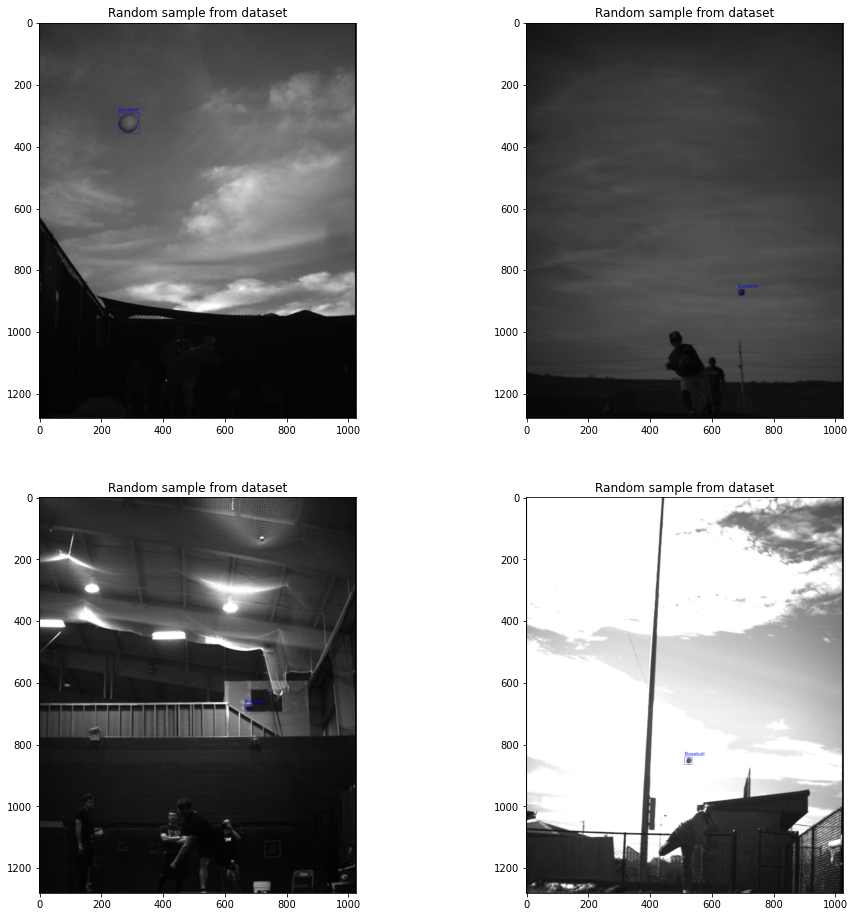

In [9]:
plot_image_slices(rows, num_rows=2, num_columns=2)

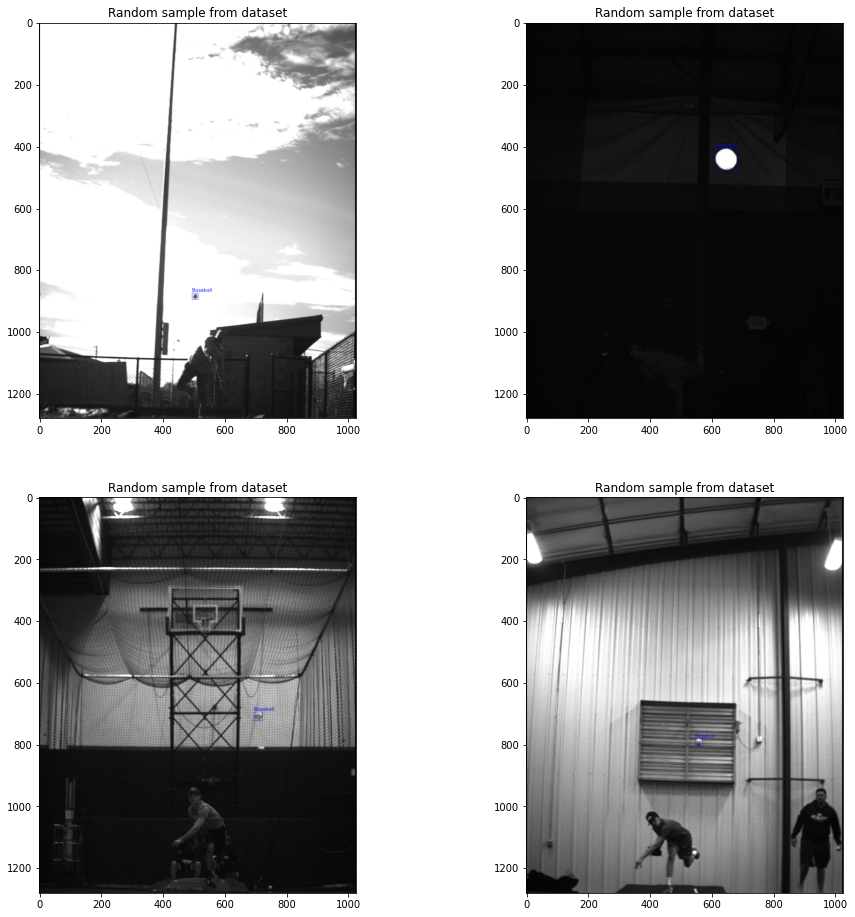

In [10]:
plot_image_slices(rows, num_rows=2, num_columns=2)

In [8]:
# Initialize the list of data (images), our target output predictions (bounding box coordinates), 
# along with the filenames of the individual images
data = []
targets = []
image_paths = []

# Loop over the rows
for row in tqdm((rows[1:])):
  # Break the row into the filename and bounding box coordinates
  row = row.split(',')
  (image_path, startX, startY, w, h) = row
  # Load the image and preprocess it 
  image = load_img(image_path, target_size=(224, 224))
  image = img_to_array(image)
  # Update our list of data, targets, and image_paths
  data.append(image)
  targets.append((startX, startY, w, h))
  image_paths.append(image_path)

# Convert the data and targets to NumPy arrays, scaling the input
# pixel intensities from the range [0, 255] to [0, 1]
data = np.array(data, dtype='float32') / 255.0
targets = np.array(targets, dtype='float32')

# Partition the data into training and testing splits using 90% of
# the data for training and the remaining 10% for testing
split = train_test_split(data, targets, image_paths, test_size=0.10, random_state=42)
# Unpack the data split
(trainImages, testImages) = split[:2]
(trainTargets, testTargets) = split[2:4]
(trainFilenames, testFilenames) = split[4:]
print("[INFO] %d samples loaded succesfully." % (len(data)))
print("[INFO] there are %d training samples %d validation samples." % (len(trainImages), len(testImages)))

# Write the testing filenames to disk so that we can use then
# when evaluating/testing our bounding box regressor
print("[INFO] saving testing filenames...")
f = open(TEST_IMAGES_PATH, 'w')
f.write('\n'.join(testFilenames))
f.close()


[INFO] 1229 samples loaded succesfully.
[INFO] there are 1106 training samples 123 validation samples.
[INFO] saving testing filenames...


Create a image augmentation generator inorder to get higher performance.

In [16]:
train_datagen = ImageDataGenerator(
    zoom_range=0.3, 
    rotation_range=50, 
    width_shift_range=0.2, 
    height_shift_range=0.2, 
    shear_range=0.2, 
    horizontal_flip=True, 
    fill_mode='nearest')

val_datagen = ImageDataGenerator()

train_generator = train_datagen.flow(trainImages, trainTargets, batch_size=32)
val_generator = val_datagen.flow(testImages, testTargets, batch_size=16)

In [23]:
# Load the VGG16 network, ensuring the head FC layers are left off
mobilenet = MobileNetV2(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))
# Freeze all VGG layers so they will *not* be updated during the training process
mobilenet.trainable = False
# Flatten the max-pooling output of VGG
flatten = mobilenet.output
flatten = Flatten()(flatten)
# Construct a fully-connected layer header to output the predicted bounding box coordinates
bboxHead = Dense(16, activation="relu")(flatten)
bboxHead = BatchNormalization()(bboxHead)
bboxHead = Dropout(0.3)(bboxHead)
bboxHead = Dense(4, activation="sigmoid")(bboxHead)
# Construct the model we will fine-tune for bounding box regression
model = Model(inputs=mobilenet.input, outputs=bboxHead)

/tensorflow-1.15.2/python3.7/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


In [24]:
# Initialize the optimizer, compile the model, and show the model summary
opt = Adam(lr=INIT_LR, decay=DECAY_RATE)#, momentum=MOMENTUM)
model.compile(optimizer=opt, loss='mse', metrics=['mse'])

# Define callbacks
checkpoint_cb = keras.callbacks.ModelCheckpoint(
    BASE_OUTPUT + '/model.{epoch:02d}-{val_loss:.2f}.h5', monitor='val_loss', verbose=0, save_best_only=True, mode='auto'
)
reduce_lr_cb = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.2, patience=5, min_lr=0.01
)

# Train the network for bounding box regression
print("[INFO] training bounding box regressor...")
history = model.fit(trainImages, trainTargets, 
  validation_data=(testImages, testTargets), 
  batch_size=BATCH_SIZE, 
  epochs=NUM_EPOCHS, 
  verbose=1)

# Use this one to include augmentation processes
"""
history = model.fit_generator(
  train_generator, 
  steps_per_epoch=len(trainImages)/BATCH_SIZE, 
  epochs=NUM_EPOCHS,
  validation_data=val_generator, 
  validation_steps=len(testImages)/(BATCH_SIZE/2),
  verbose=1)
"""

[INFO] training bounding box regressor...
Train on 1106 samples, validate on 123 samples
Epoch 1/30
1106/1106 [==============================] - 4s 4ms/sample - loss: 0.1416 - mean_squared_error: 0.1416 - val_loss: 0.0957 - val_mean_squared_error: 0.0957
Epoch 2/30
1106/1106 [==============================] - 2s 2ms/sample - loss: 0.1178 - mean_squared_error: 0.1178 - val_loss: 0.0758 - val_mean_squared_error: 0.0758
Epoch 3/30
1106/1106 [==============================] - 2s 2ms/sample - loss: 0.1042 - mean_squared_error: 0.1042 - val_loss: 0.0670 - val_mean_squared_error: 0.0670
Epoch 4/30
1106/1106 [==============================] - 2s 2ms/sample - loss: 0.0905 - mean_squared_error: 0.0905 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 5/30
1106/1106 [==============================] - 2s 2ms/sample - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 6/30
1106/1106 [==============================] - 2s 2ms/sample - loss: 0.0

'\nhistory = model.fit_generator(\n  train_generator, \n  steps_per_epoch=len(trainImages)/BATCH_SIZE, \n  epochs=NUM_EPOCHS,\n  validation_data=val_generator, \n  validation_steps=len(testImages)/(BATCH_SIZE/2),\n  verbose=1)\n'

Plot mode's training and validation losses.

[INFO] saving object detector model...


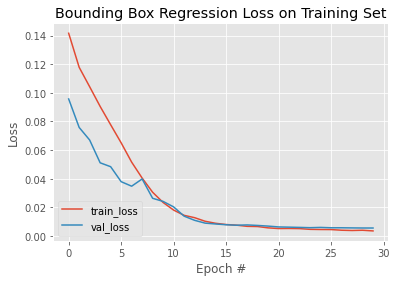

In [25]:
print("[INFO] saving object detector model...")
model.save(KERAS_MODEL_PATH, save_format='h5')
# plot the model training history
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, NUM_EPOCHS), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, NUM_EPOCHS), history.history["val_loss"], label="val_loss")
plt.title("Bounding Box Regression Loss on Training Set")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(PLOT_PATH)

Read previously saves test images into a list.

In [ ]:
# Determine the input file type, but assume that we're working with single input image
filetype = mimetypes.guess_type('output/test_images.txt')[0]
# If the file type is a text file, then we need to process *multiple* images
if "text/plain" == filetype:
	# Load the filenames in our testing file and initialize our list of image paths
	test_images = open('output/test_images.txt').read().strip().split("\n")
	test_imagePaths = []
	# Loop over the filenames
	for test_image in test_images:
		# Construct the full path to the image filename and then update our image paths list
		test_imagePaths.append(test_image)

Perform prediction on all of the test images and store prediction results in a list.

In [ ]:
preds = []
# loop over the images that we'll be testing using our bounding box regression model
for test_imagePath in test_imagePaths:
  # load the input image (in Keras format) from disk and preprocess
  # it, scaling the pixel intensities to the range [0, 1]
  image = load_img(test_imagePath, target_size=(224, 224))
  image = img_to_array(image) / 255.0
  image = np.expand_dims(image, axis=0)

  # make bounding box predictions on the input image
  pred = model.predict(image)[0]
  preds.append(pred)

Visualize prediction results on randomly choosen test images.

[INFO] loading object detector...


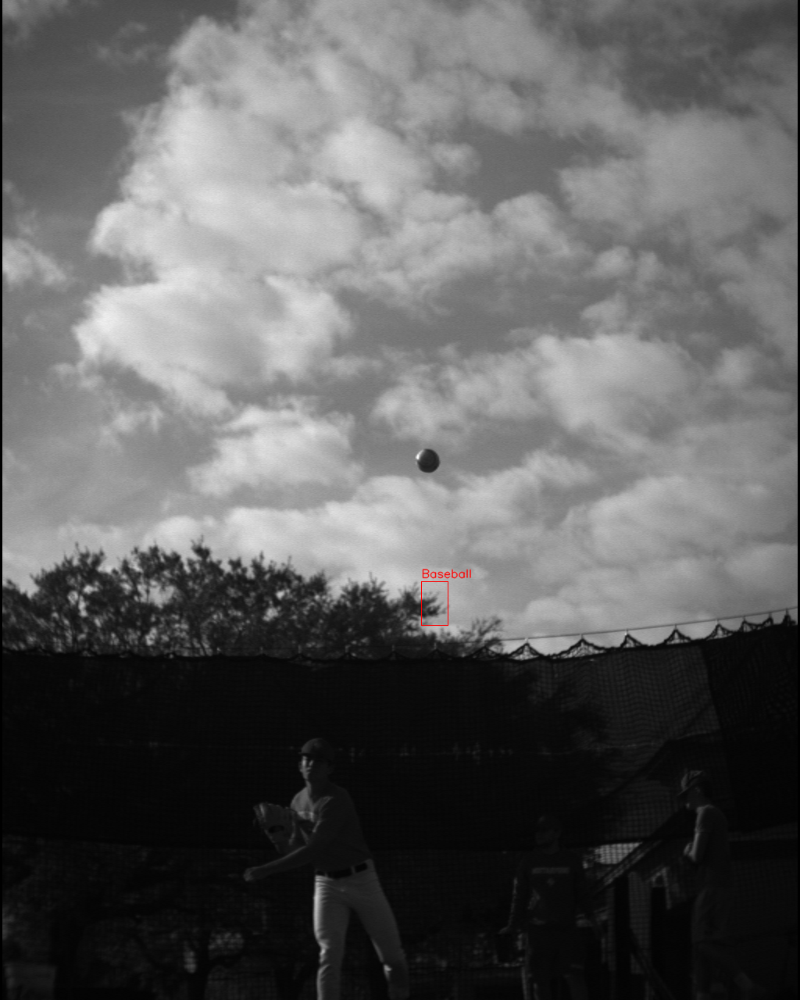

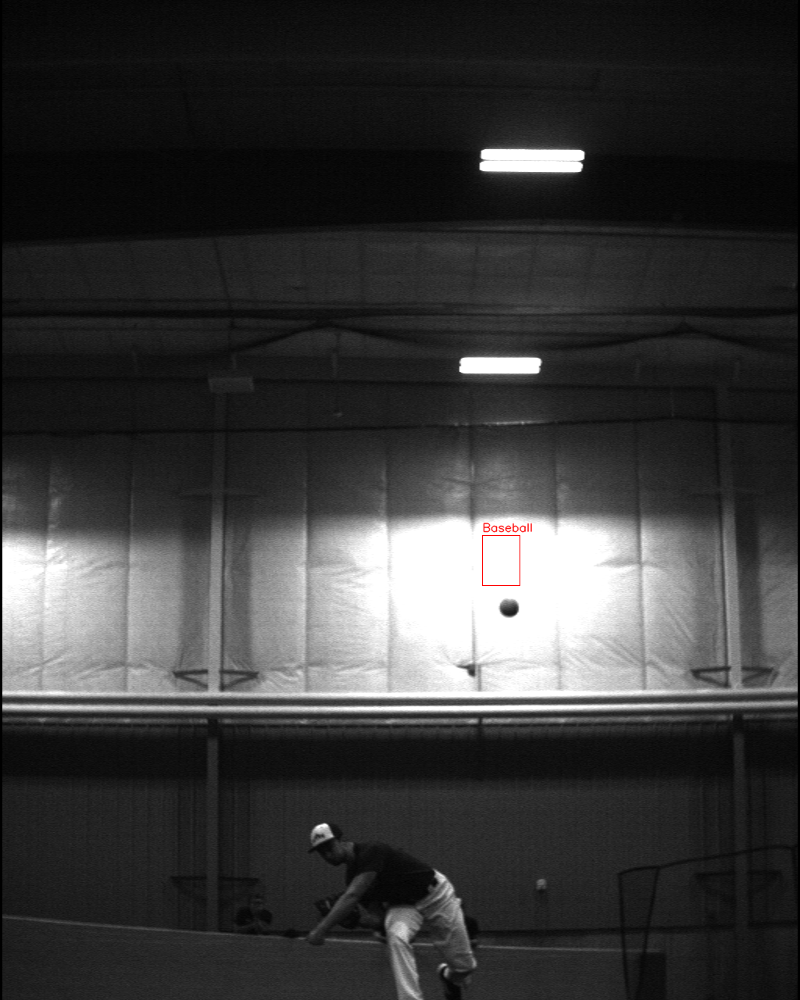

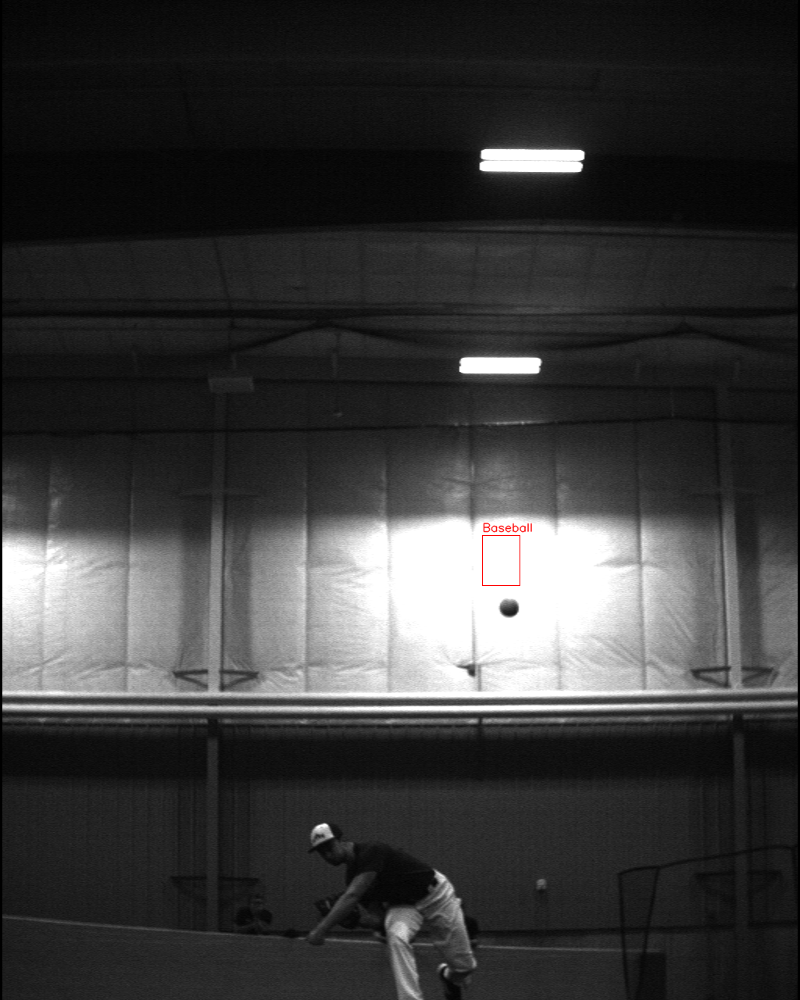

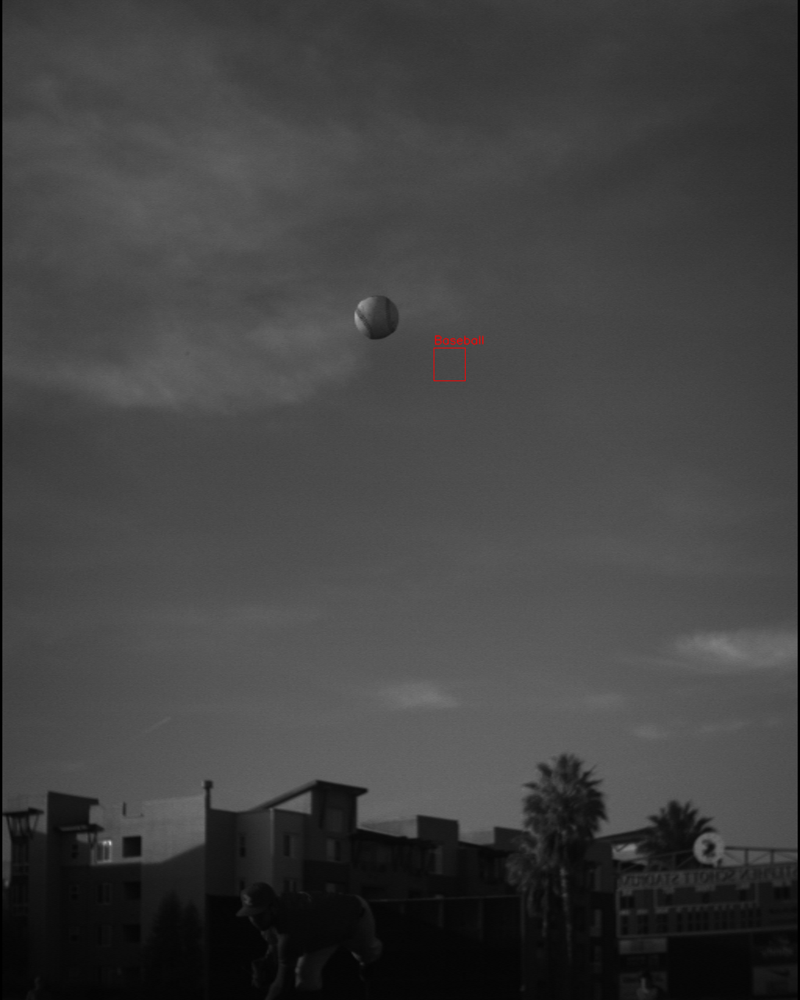

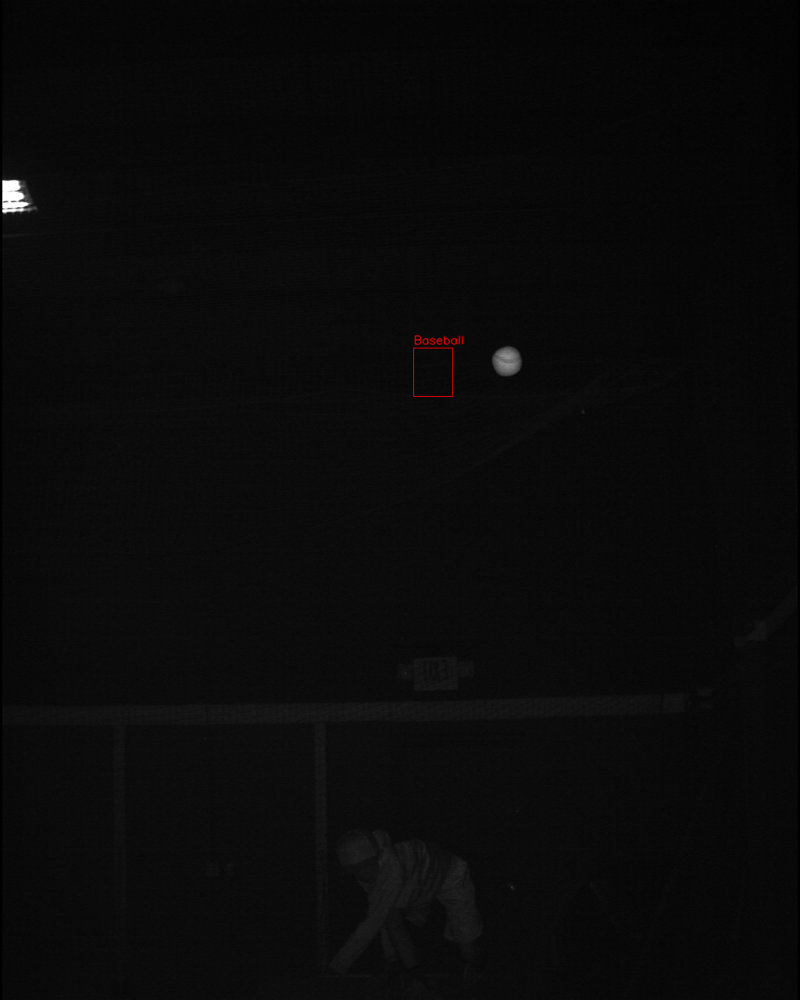

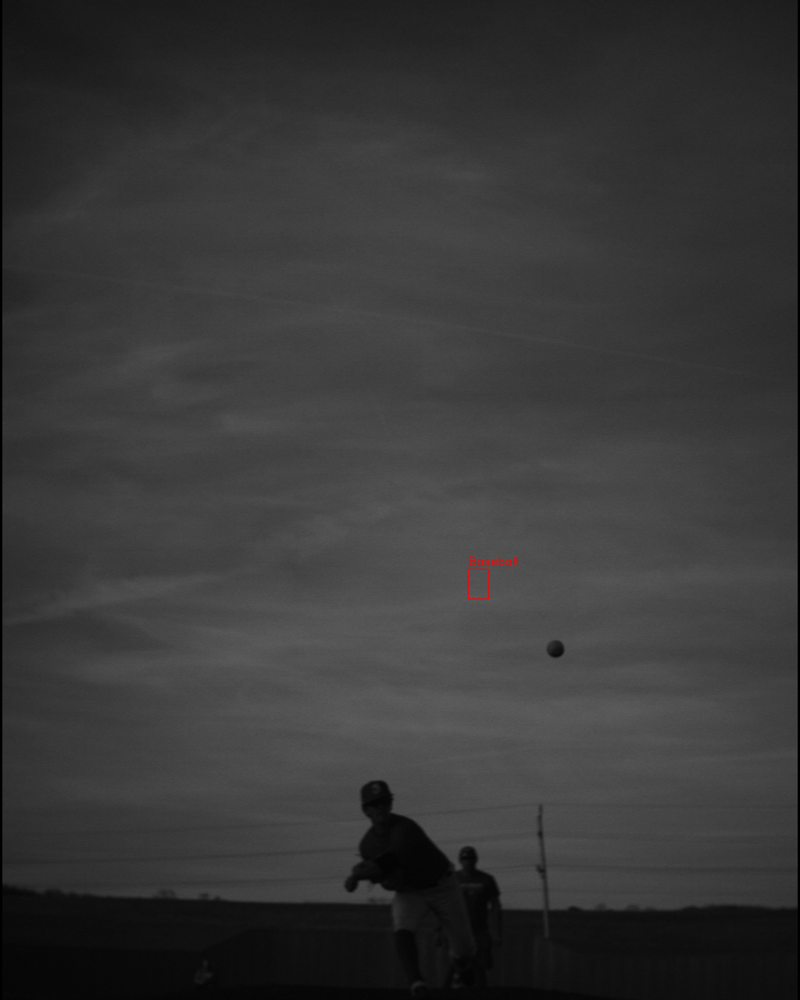

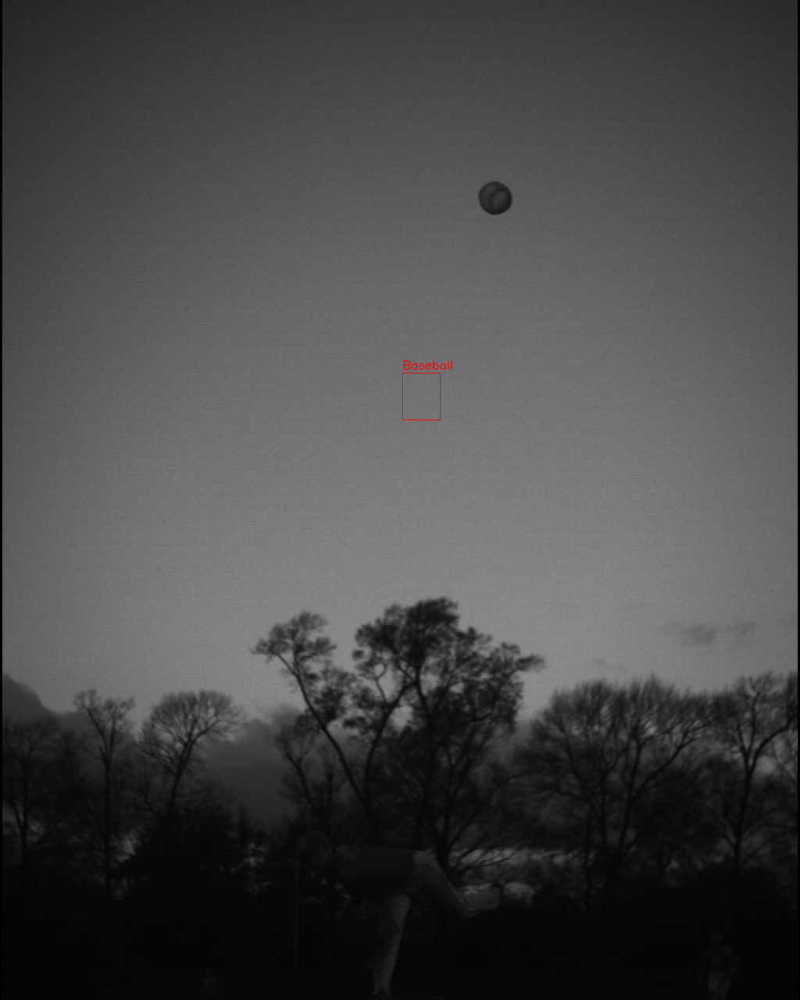

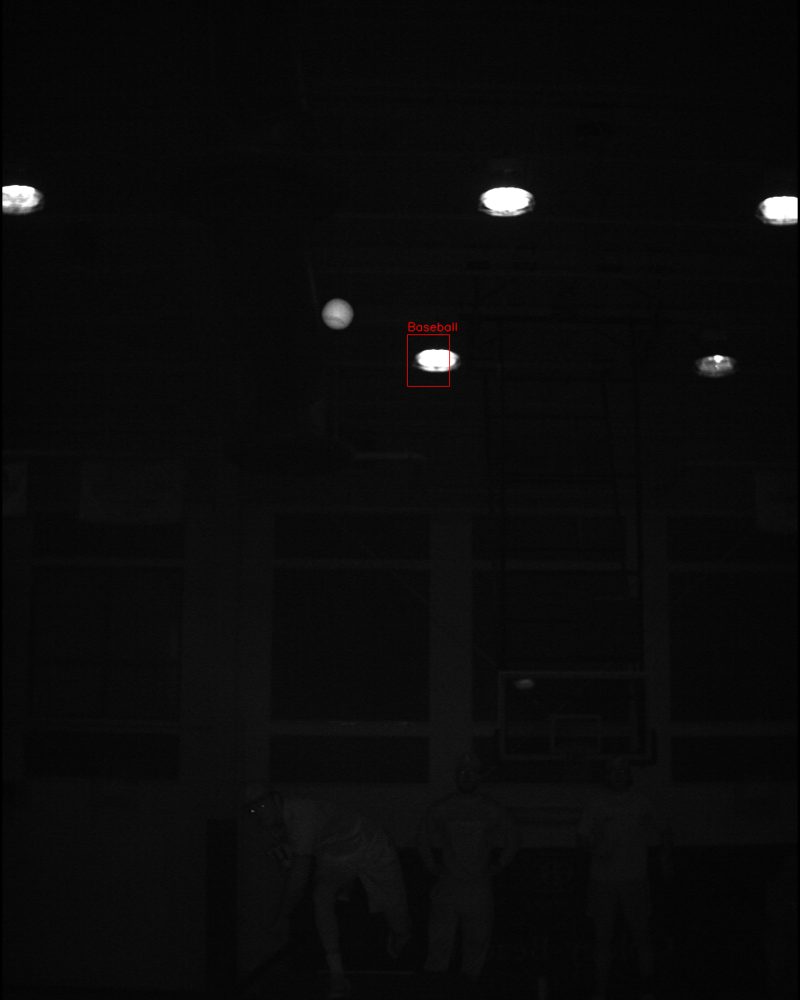

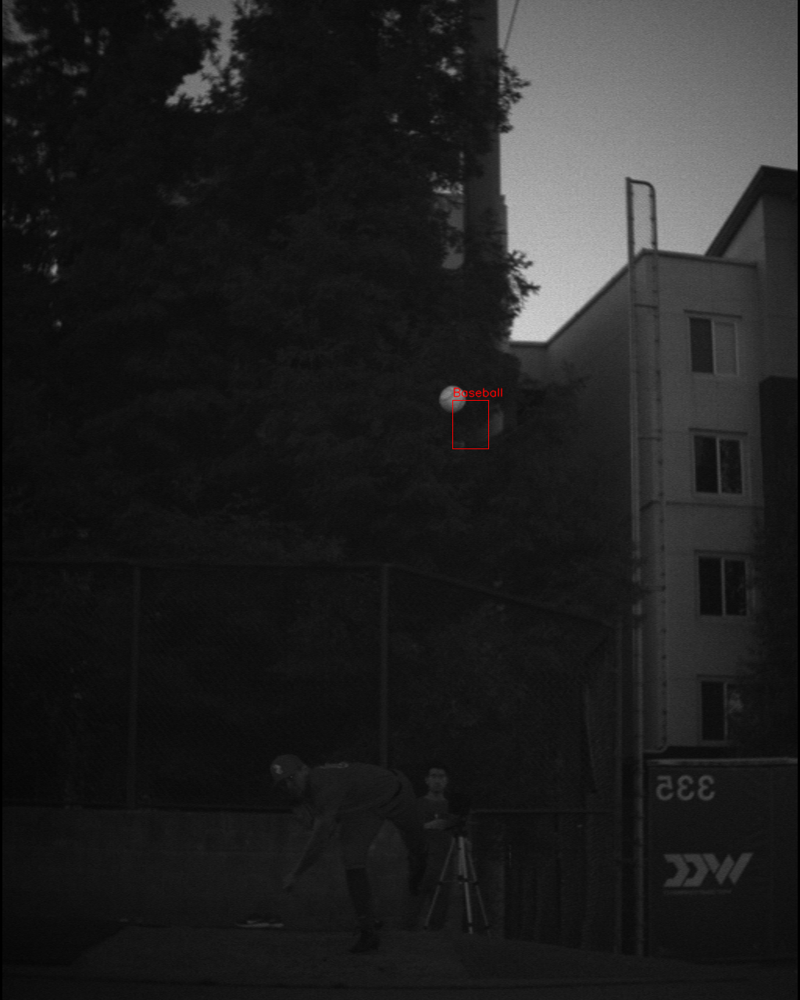

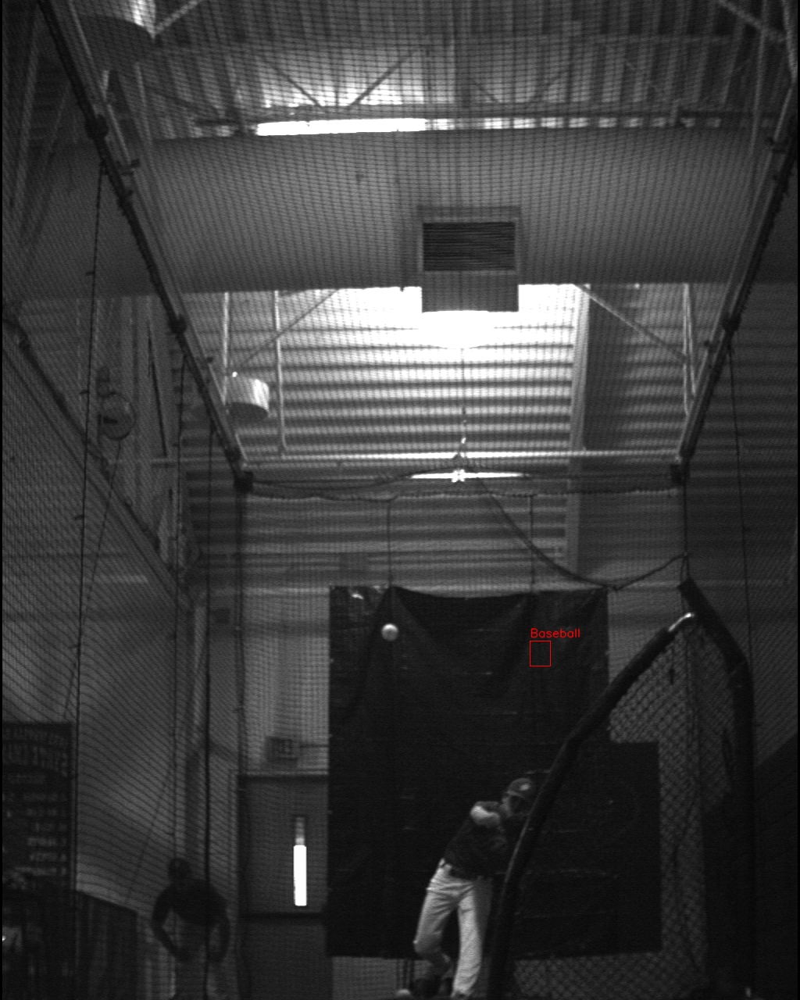

In [ ]:
# Load our trained bounding box regressor from disk
print("[INFO] loading object detector...")
model = load_model(KERAS_MODEL_PATH)
# Loop over the images that we'll be testing using our bounding box regression model
for i in range(10):
  random_index = random.randint(0, len(test_imagePaths)-1)
  # Load the input image (in Keras format) from disk and preprocess it, scaling the pixel intensities to the range [0, 1]
  image = load_img(test_imagePaths[random_index], target_size=(224, 224))
  image = img_to_array(image) / 255.0
  image = np.expand_dims(image, axis=0)

  # Make bounding box predictions on the input image
  pred = model.predict(image)[0]
  (startX, startY, w, h) = pred

  # Load the input image (in OpenCV format), resize it such that it fits on our screen, and grab its dimensions
  image = cv2.imread(test_imagePaths[random_index])
  (image_h, image_w) = image.shape[:2]
  # Scale the predicted bounding box coordinates based on the image dimensions
  startX = int((startX) * image_w)
  startY = int((startY) * image_h)
  w = int((w) * image_w)
  h = int((h) * image_h)
  # Draw the predicted bounding box on the image
  cv2.rectangle(image, (startX-int(w/2), startY-int(h/2)), (startX+int(w/2), startY+int(h/2)), 
                (0, 0, 255), 1)
  cv2.putText(image, 'Baseball', (startX-int(w/2), startY-int(h/2)-5), cv2.FONT_HERSHEY_SIMPLEX, 
              0.5, (0, 0, 255), 1, cv2.LINE_AA)
  # Show the output image
  cv2_imshow(image)
  cv2.waitKey(0)